##PACKAGES TO IMPORT

In [2]:
!pip install ultralytics
!pip install supervision
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 73.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 118.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

##Model Initialization

In [3]:
model=YOLO('/content/best (1).pt')

##TYPE-1 (conf-0.019,0.02,0.03)


It is for wide-angle indoor poultry farm image with high chicken density, medium ambient light


0: 384x640 103 chickens, 102.1ms
Speed: 3.3ms preprocess, 102.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


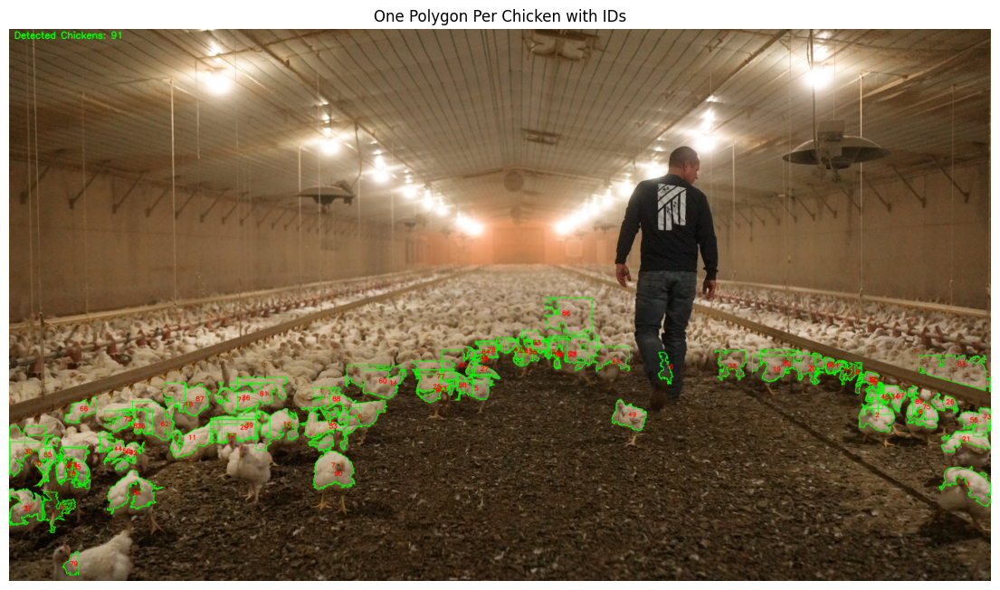

True

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/tyler_dutton-min.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.019)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


It is for medium-crowd poultry scenario in bright natural light with semi-overhead camera angle


0: 640x416 108 chickens, 215.5ms
Speed: 4.4ms preprocess, 215.5ms inference, 7.3ms postprocess per image at shape (1, 3, 640, 416)


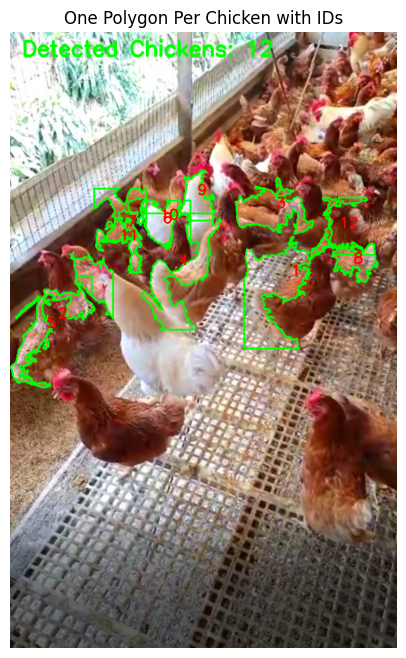

True

In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/WhatsApp Image 2025-06-08 at 21.18.46_104a455d.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.02)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


Good for controlled indoor cage with bright lighting and small, young broiler chicks


0: 640x640 14 chickens, 229.2ms
Speed: 1.7ms preprocess, 229.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


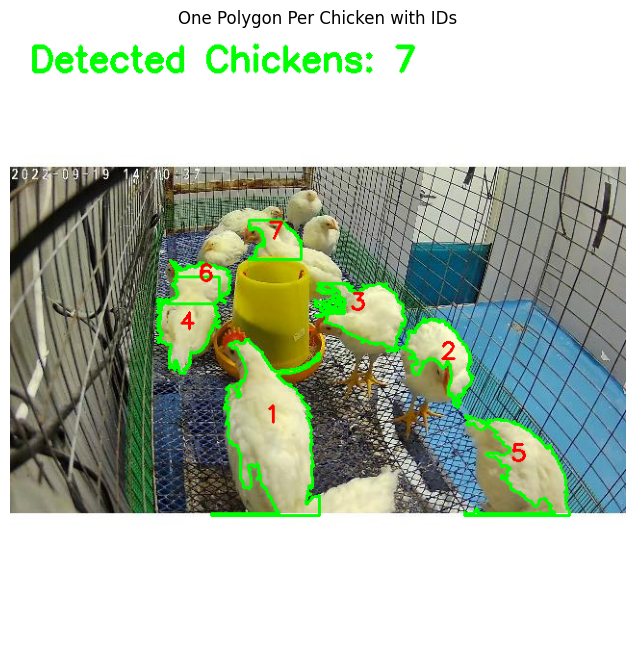

True

In [62]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/WhatsApp Image 2025-06-08 at 21.19.15_745cb01c.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.02)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


Low-light litter floor poultry farm with high-density white broilers and moderate occlusion.


0: 640x640 51 chickens, 181.4ms
Speed: 1.7ms preprocess, 181.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


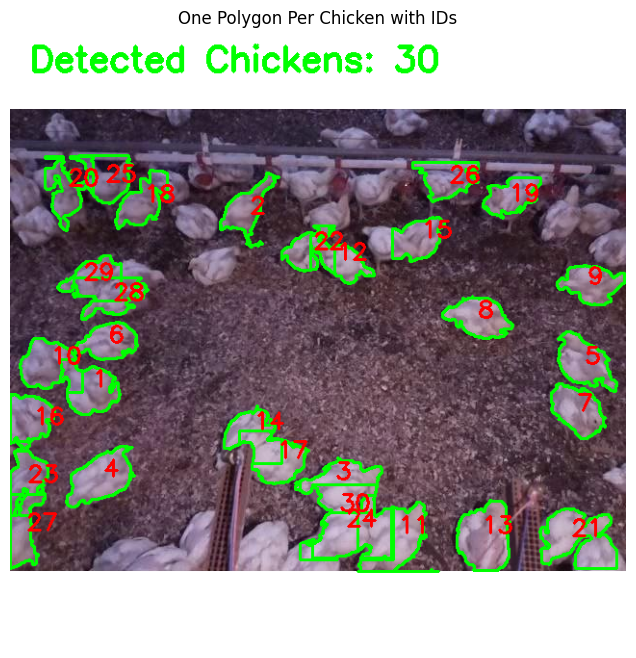

True

In [63]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/WhatsApp Image 2025-06-08 at 21.19.50_dbc20370.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.02)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


High-density commercial layer farm with multi-tier mesh flooring, strong backlight, and heavy occlusion.


0: 384x640 30 chickens, 120.3ms
Speed: 2.5ms preprocess, 120.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


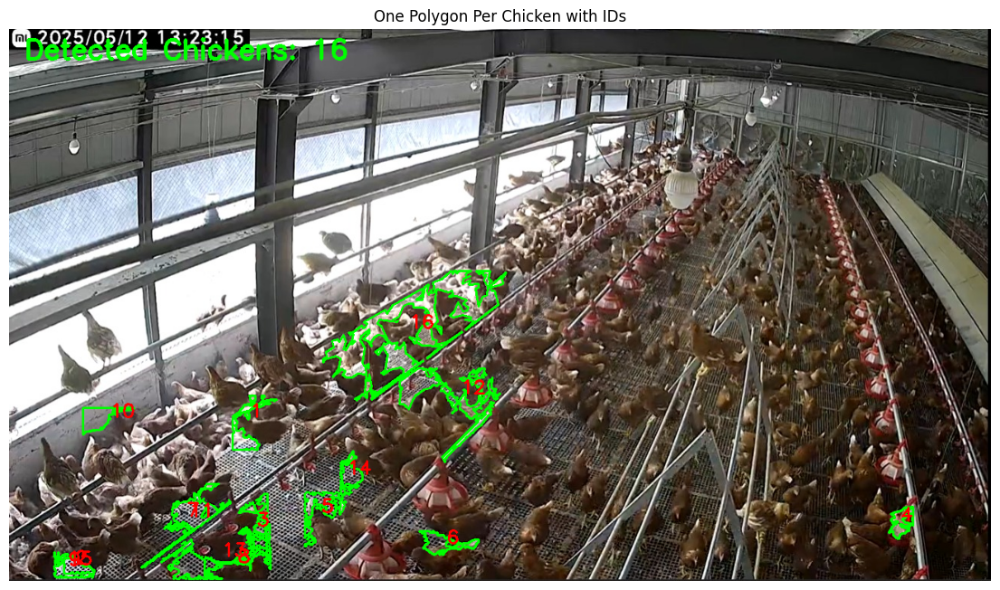

True

In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load Image
image_path = "/content/WhatsApp Image 2025-06-08 at 15.53.53_734f515f.jpg"
image = cv2.imread(image_path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)

# Step 2: Brightness Normalization
if mean_brightness < 40:
    image = cv2.convertScaleAbs(image, alpha=2.5, beta=43)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model
try:
    model
except NameError:
    model = YOLO("/content/best (1).pt")  # Use your trained model

# Step 4: YOLO Inference
results = model.predict(image, conf=0.02)

# Step 5: Detection Postprocessing
polygons = []
chicken_class_ids = [0]  # Modify if needed

for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1, y1 = max(x1, 0), max(y1, 0)
        x2, y2 = min(x2, image.shape[1]), min(y2, image.shape[0])
        w, h = x2 - x1, y2 - y1

        aspect_ratio = w / h if h != 0 else 0
        if not (0.3 <= aspect_ratio <= 2.0):
            continue
        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        area = cv2.contourArea(largest)
        if not (550 <= area <= 60000):
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        polygons.append(polygon_points)
        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)

# Step 6: Draw IDs
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 7: Summary Text
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 8: Display
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 9: Save
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


Outdoor free-range setting with clear natural lighting, brown hens on green grass, low occlusion and high visibility.


0: 384x640 9 chickens, 190.2ms
Speed: 2.0ms preprocess, 190.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


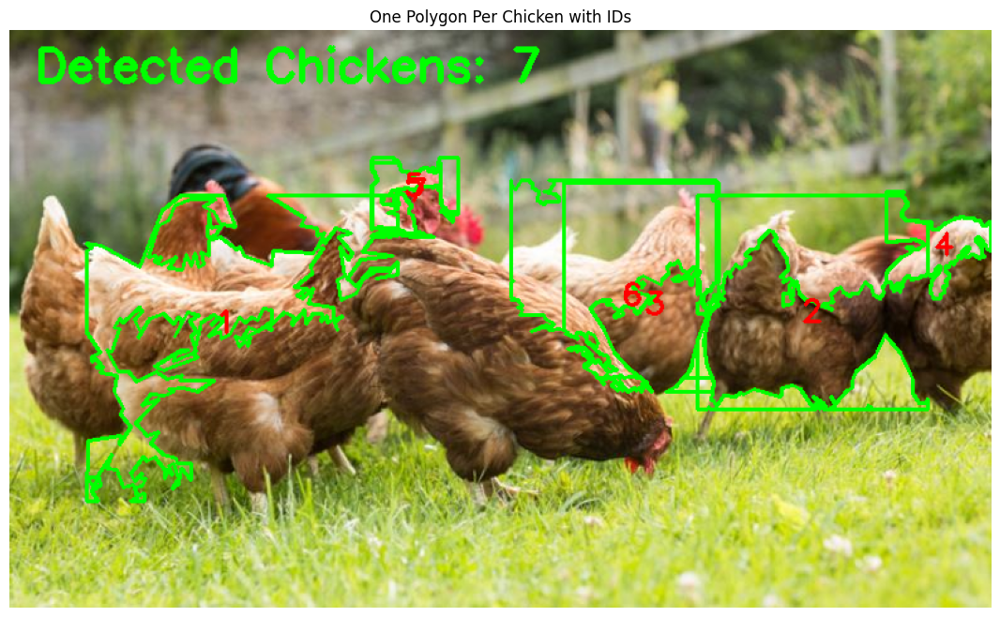

True

In [61]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/WhatsApp Image 2025-06-08 at 21.18.46_3e0c5913.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.02)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


Free-range environment with chickens standing on grass, clear daylight and minimal occlusion in open rural background.


0: 352x640 11 chickens, 133.2ms
Speed: 1.9ms preprocess, 133.2ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)


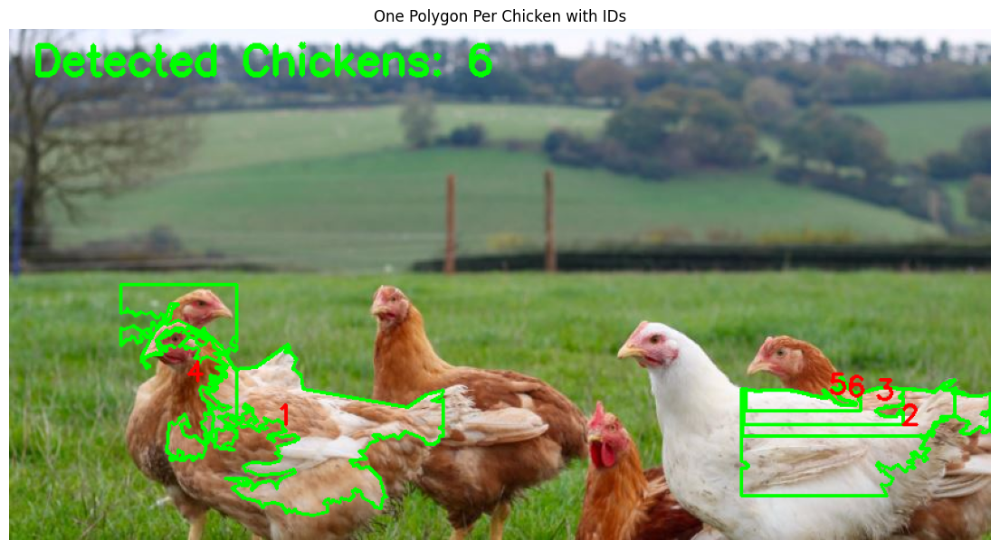

True

In [56]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/WhatsApp Image 2025-06-08 at 21.18.29_61fcb9c6.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.03)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


##TYPE-2 (conf-0.1)

Dense indoor poultry farm with white chickens under natural light.


0: 352x640 86 chickens, 102.6ms
Speed: 2.2ms preprocess, 102.6ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)


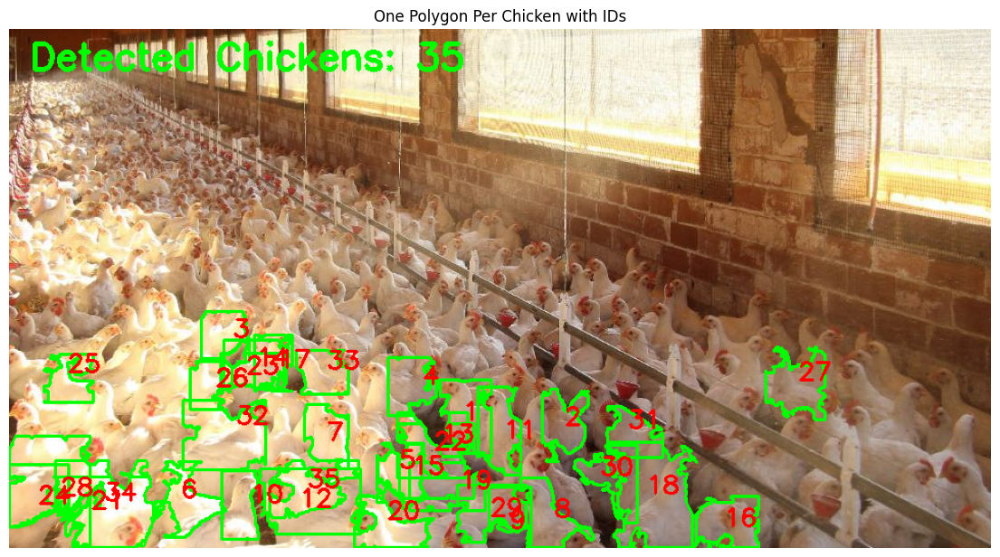

True

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/WhatsApp Image 2025-06-08 at 21.18.29_92abc35d.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.1)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


Free-range environment with chickens on grassy ground, captured in clear daylight.


0: 640x640 7 chickens, 125.8ms
Speed: 1.4ms preprocess, 125.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


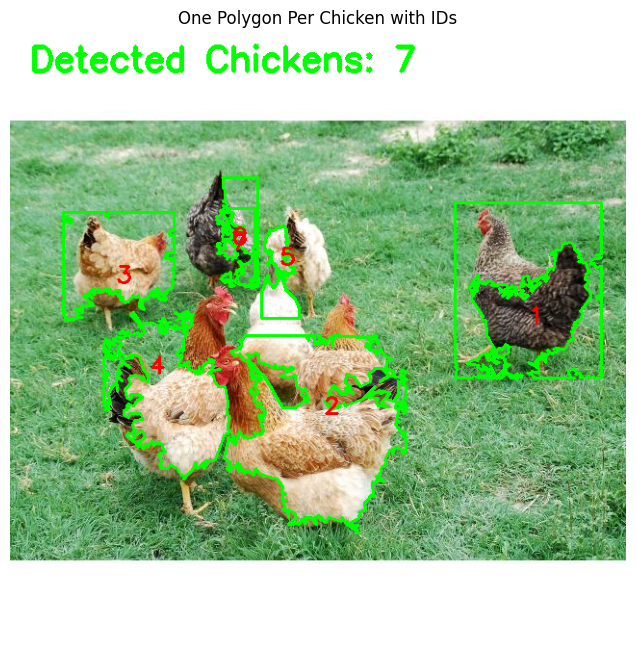

True

In [64]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
from ultralytics import YOLO

# Step 1: Load image
image_path = "/content/WhatsApp Image 2025-06-08 at 21.20.05_43b1c9c3.jpg"
image = cv2.imread(image_path)

# Step 2: Auto-brightness adjustment if too dark
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
mean_brightness = np.mean(gray)
brightness_threshold = 40  # Tune this value as needed

if mean_brightness < brightness_threshold:
    alpha = 2.5  # Contrast control
    beta = 43    # Brightness control
    image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 3: Load YOLO Model (make sure it's loaded)
try:
    model
except NameError:
    model = YOLO("yolov8n.pt")  # Replace with your actual model file

# Step 4: YOLO Prediction
results = model.predict(image, conf=0.1)

# Step 5: Initialize
bounding_boxes = []
polygons = []
chicken_class_ids = [0]  # Replace with actual chicken class ID (usually 0 in custom models)

# Step 6: Process detections
for r in results:
    for box, cls in zip(r.boxes.xyxy.cpu().numpy(), r.boxes.cls.cpu().numpy()):
        if int(cls) not in chicken_class_ids:
            continue

        x1, y1, x2, y2 = map(int, box)
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        w = x2 - x1
        h = y2 - y1
        aspect_ratio = w / h if h != 0 else 0

        if aspect_ratio > 2.0 or aspect_ratio < 0.3:
            continue

        if y2 < image.shape[0] * 0.3:
            continue

        crop = image[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        gray_crop = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
        _, thresh = cv2.threshold(gray_crop, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if not contours:
            continue

        largest = max(contours, key=cv2.contourArea)
        if cv2.contourArea(largest) < 1500 or cv2.contourArea(largest) > 25000:
            continue

        epsilon = 0.0008 * cv2.arcLength(largest, True)
        approx = cv2.approxPolyDP(largest, epsilon, True)
        polygon_points = (approx + [x1, y1]).reshape(-1, 2)

        xyxy_box = sv.polygon_to_xyxy(polygon_points)
        bounding_boxes.append(xyxy_box)
        polygons.append(polygon_points)

        cv2.polylines(image_rgb, [polygon_points], isClosed=True, color=(0, 255, 0), thickness=2)


# Step 7: Label each polygon with an ID
for idx, polygon in enumerate(polygons):
    centroid = np.mean(polygon, axis=0).astype(int)
    cv2.putText(image_rgb, str(idx + 1), tuple(centroid), cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2)

# Step 8: Add total count
cv2.putText(image_rgb, f"Detected Chickens: {len(polygons)}", (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

# Step 9: Show final result
plt.figure(figsize=(14, 8))
plt.imshow(image_rgb)
plt.axis('off')
plt.title("One Polygon Per Chicken with IDs")
plt.show()

# Step 10: Save result
cv2.imwrite("/content/chicken_polygons_output.jpg", cv2.cvtColor(image_rgb, cv2.COLOR_RGB2BGR))


##If you need to do Transfer Learning, USe the following code

In [ ]:
# Load base model (pretrained or previous fine-tuned)
model = YOLO('/content/best (1).pt')  # Use yolov8n.pt or yolov8s.pt if dataset is small

# Training with enhanced config
model.train(
    data='/content/dataset2/data.yaml',
    epochs=50,  # train longer
    imgsz=896,  # increase input size
    batch=4,
    patience=30,
    workers=2,
    name='chicken_wide_farm_aug',
    device='cpu',

    # Optimizer and scheduler
    lr0=2e-3,
    optimizer='AdamW',  # better for dense scenes
    weight_decay=0.01,
    momentum=0.9,

    # Regularization & dropout
    dropout=0.2,

    # Aggressive Augmentations
    mosaic=1.0,
    mixup=0.5,           # higher for more blending
    copy_paste=0.2,      # enable Copy-Paste
    hsv_h=0.02,
    hsv_s=0.8,
    hsv_v=0.5,
    degrees=10,
    translate=0.2,
    scale=0.7,
    shear=3.0,
    perspective=0.001,
    flipud=0.05,
    fliplr=0.5,

    # Save checkpoints
    save_period=10
)

##README.md

# Chicken Counting Dataset (v17)

This dataset is designed for object detection tasks involving chicken counting and monitoring. It has been curated and augmented using Roboflow and is formatted in **YOLOv11**.

## 📊 Dataset Split

- **Total Images**: 12,703
- **Train Set**: 11,100 images (87%)
- **Validation Set**: 1,103 images (9%)
- **Test Set**: 500 images (4%)

## 📁 Directory Structure

```yaml
train: ../train/images
val: ../valid/images
test: ../test/images
🐔 Classes
nc: 1

names: ['chicken']

🧠 Format
Annotation format: YOLOv11

Each image is labeled for the presence of chickens.

🛠 Pre-processing
Each image in the dataset has undergone the following processing:

Auto-orientation of pixel data (EXIF data stripped)

Resized to 640x640 using "fit" mode (white padding to maintain aspect ratio)

🔄 Augmentation Techniques
Three augmented versions of each source image were generated using:

✅ 50% probability of horizontal flip

🔄 Random rotation between -8° to +8°

💡 Brightness variation between -10% to +10%

🔬 Gaussian blur (0 to 1.5 px)

⚪ Salt-and-pepper noise added to 1.5% of the pixels

🔗 Dataset Source :- https://universe.roboflow.com/thesis-3c51t/chicken-counting/dataset/17

**Dataset Download Code**

In [ ]:
%%bash
cd /content
mkdir -p dataset2
cd dataset2
curl -L "https://universe.roboflow.com/ds/l0JdPqNrPx?key=mt2ji07rnR" -o roboflow.zip
unzip -q roboflow.zip
rm roboflow.zip